##Setup

You will need to make a copy of this notebook in your Google Drive before you can edit the homework files. You can do so with **File &rarr; Save a copy in Drive**.

In [31]:
#@title mount your Google Drive
#@markdown Your work will be stored in a folder called `cs285_f2021` by default to prevent Colab instance timeouts from deleting your edits.

import os
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [32]:
#@title set up mount symlink

DRIVE_PATH = '/content/gdrive/My\ Drive/cs285_f2021'
DRIVE_PYTHON_PATH = DRIVE_PATH.replace('\\', '')
if not os.path.exists(DRIVE_PYTHON_PATH):
  %mkdir $DRIVE_PATH

## the space in `My Drive` causes some issues,
## make a symlink to avoid this
SYM_PATH = '/content/cs285_f2021'
if not os.path.exists(SYM_PATH):
  !ln -s $DRIVE_PATH $SYM_PATH

In [33]:
#@title apt install requirements

#@markdown Run each section with Shift+Enter

#@markdown Double-click on section headers to show code.

!apt update 
!apt install -y --no-install-recommends \
        build-essential \
        curl \
        git \
        gnupg2 \
        make \
        cmake \
        ffmpeg \
        swig \
        libz-dev \
        unzip \
        zlib1g-dev \
        libglfw3 \
        libglfw3-dev \
        libxrandr2 \
        libxinerama-dev \
        libxi6 \
        libxcursor-dev \
        libgl1-mesa-dev \
        libgl1-mesa-glx \
        libglew-dev \
        libosmesa6-dev \
        lsb-release \
        ack-grep \
        patchelf \
        wget \
        xpra \
        xserver-xorg-dev \
        xvfb \
        python-opengl \
        ffmpeg

Ign:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease
Hit:3 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:4 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Ign:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:6 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Hit:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:8 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:11 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Get:12 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Hit:13 http://ppa.launchpad.net/graph

In [34]:
#@title set up mount symlink
import os
DRIVE_PATH = '/content/gdrive/My\ Drive/cs285_f2021'
DRIVE_PYTHON_PATH = DRIVE_PATH.replace('\\', '')
if not os.path.exists(DRIVE_PYTHON_PATH):
  %mkdir $DRIVE_PATH

## the space in `My Drive` causes some issues,
## make a symlink to avoid this
SYM_PATH = '/content/cs285_f2021'
if not os.path.exists(SYM_PATH):
  !ln -s $DRIVE_PATH $SYM_PATH

In [35]:
!apt-get install -y \
    libgl1-mesa-dev \
    libgl1-mesa-glx \
    libglew-dev \
    libosmesa6-dev \
    software-properties-common

!apt-get install -y patchelf

!pip install gym

!pip install free-mujoco-py

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libglew-dev is already the newest version (2.0.0-5).
libgl1-mesa-dev is already the newest version (20.0.8-0ubuntu1~18.04.1).
libgl1-mesa-glx is already the newest version (20.0.8-0ubuntu1~18.04.1).
libosmesa6-dev is already the newest version (20.0.8-0ubuntu1~18.04.1).
software-properties-common is already the newest version (0.96.24.32.18).
0 upgraded, 0 newly installed, 0 to remove and 61 not upgraded.
Reading package lists... Done
Building dependency tree       
Reading state information... Done
patchelf is already the newest version (0.9-1).
0 upgraded, 0 newly installed, 0 to remove and 61 not upgraded.


In [ ]:
import os
os.kill(os.getpid(), 9)

In [1]:
import mujoco_py
import gym

In [2]:
#@title set up mount symlink
import os
DRIVE_PATH = '/content/gdrive/My\ Drive/cs285_f2021'
DRIVE_PYTHON_PATH = DRIVE_PATH.replace('\\', '')
if not os.path.exists(DRIVE_PYTHON_PATH):
  %mkdir $DRIVE_PATH

## the space in `My Drive` causes some issues,
## make a symlink to avoid this
SYM_PATH = '/content/cs285_f2021'
if not os.path.exists(SYM_PATH):
  !ln -s $DRIVE_PATH $SYM_PATH

In [3]:
#@title clone homework repo

%cd $SYM_PATH
!git clone https://github.com/Karesto/DRL-IASD.git


/content/gdrive/My Drive/cs285_f2021
fatal: destination path 'DRL-IASD' already exists and is not an empty directory.
/content/gdrive/MyDrive/cs285_f2021/DRL-IASD/hw1


In [5]:
%cd $SYM_PATH

%cd DRL-IASD/hw1


/content/gdrive/My Drive/cs285_f2021
/content/gdrive/My Drive/cs285_f2021/DRL-IASD/hw1


In [6]:
%pip install -r requirements_colab.txt
%pip install -e .

Obtaining file:///content/gdrive/MyDrive/cs285_f2021/DRL-IASD/hw1
  Attempting uninstall: cs285
    Found existing installation: cs285 0.1.0
    Can't uninstall 'cs285'. No files were found to uninstall.
  Running setup.py develop for cs285


In [7]:
#@title set up virtual display

from pyvirtualdisplay import Display

display = Display(visible=0, size=(1400, 900))
display.start()

In [8]:
#@title test virtual display

#@markdown If you see a video of a four-legged ant fumbling about, setup is complete!

import gym
from cs285.infrastructure.colab_utils import (
    wrap_env,
    show_video
) 

env = wrap_env(gym.make("Ant-v2"))

observation = env.reset()
for i in range(100):
    env.render(mode='rgb_array')
    obs, rew, term, _ = env.step(env.action_space.sample() ) 
    if term:
      break;
            
env.close()
print('Loading video...')
show_video()

Loading video...


## Editing Code

To edit code, click the folder icon on the left menu. Navigate to the corresponding file (`cs285_f2021/...`). Double click a file to open an editor. There is a timeout of about ~12 hours with Colab while it is active (and less if you close your browser window). We sync your edits to Google Drive so that you won't lose your work in the event of an instance timeout, but you will need to re-mount your Google Drive and re-install packages with every new instance.

## Run Behavior Cloning (Problem 1)

In [182]:
#@title imports

import os
import time
import numpy as np

from cs285.infrastructure.rl_trainer import RL_Trainer
from cs285.agents.bc_agent import BCAgent
from cs285.policies.loaded_gaussian_policy import LoadedGaussianPolicy

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [183]:
#@title runtime arguments

class Args:

  def __getitem__(self, key):
    return getattr(self, key)

  def __setitem__(self, key, val):
    setattr(self, key, val)

  #@markdown expert data
  expert_policy_file = 'cs285/policies/experts/Ant.pkl' #@param
  expert_data = 'cs285/expert_data/expert_data_Ant-v2.pkl' #@param
  env_name = 'Ant-v2' #@param ['Ant-v2', 'Humanoid-v2', 'Walker2d-v2', 'HalfCheetah-v2', 'Hopper-v2']
  exp_name = 'test_bc_ant' #@param
  do_dagger = False #@param {type: "boolean"}
  ep_len = 1000 #@param {type: "integer"}
  save_params = False #@param {type: "boolean"}

  num_agent_train_steps_per_iter = 1000 #@param {type: "integer"})
  n_iter = 1 #@param {type: "integer"})

  #@markdown batches & buffers
  batch_size = 1000 #@param {type: "integer"})
  eval_batch_size =  5000#@param {type: "integer"}
  train_batch_size = 100 #@param {type: "integer"}
  max_replay_buffer_size = 1000000 #@param {type: "integer"}

  #@markdown network
  n_layers =  2#@param {type: "integer"}
  size = 64 #@param {type: "integer"}
  learning_rate = 5e-3 #@param {type: "number"}

  #@markdown logging
  video_log_freq = 5 #@param {type: "integer"}
  scalar_log_freq = 1 #@param {type: "integer"}

  #@markdown gpu & run-time settings
  no_gpu = False #@param {type: "boolean"}
  which_gpu = 0 #@param {type: "integer"}
  seed = 1 #@param {type: "integer"}

args = Args()


In [184]:
#@title define `BC_Trainer`
class BC_Trainer(object):

    def __init__(self, params):
        #######################
        ## AGENT PARAMS
        #######################

        agent_params = {
            'n_layers': params['n_layers'],
            'size': params['size'],
            'learning_rate': params['learning_rate'],
            'max_replay_buffer_size': params['max_replay_buffer_size'],
            }

        self.params = params
        self.params['agent_class'] = BCAgent ## TODO: look in here and implement this
        self.params['agent_params'] = agent_params

        ################
        ## RL TRAINER
        ################

        self.rl_trainer = RL_Trainer(self.params) ## TODO: look in here and implement this

        #######################
        ## LOAD EXPERT POLICY
        #######################

        print('Loading expert policy from...', self.params['expert_policy_file'])
        self.loaded_expert_policy = LoadedGaussianPolicy(self.params['expert_policy_file'])
        print('Done restoring expert policy...')

    def run_training_loop(self):

        return self.rl_trainer.run_training_loop(
            n_iter=self.params['n_iter'],
            initial_expertdata=self.params['expert_data'],
            collect_policy=self.rl_trainer.agent.actor,
            eval_policy=self.rl_trainer.agent.actor,
            relabel_with_expert=self.params['do_dagger'],
            expert_policy=self.loaded_expert_policy,
        )


In [185]:
#@title create directory for logging

if args.do_dagger:
    logdir_prefix = 'q2_'  # The autograder uses the prefix `q2_`
    assert args.n_iter>1, ('DAgger needs more than 1 iteration (n_iter>1) of training, to iteratively query the expert and train (after 1st warmstarting from behavior cloning).')
else:
    logdir_prefix = 'q1_'  # The autograder uses the prefix `q1_`
    assert args.n_iter==1, ('Vanilla behavior cloning collects expert data just once (n_iter=1)')

data_path ='/content/cs285_f2021/hw1/data'
if not (os.path.exists(data_path)):
    os.makedirs(data_path)
logdir = logdir_prefix + args.exp_name + '_' + args.env_name + \
         '_' + time.strftime("%d-%m-%Y_%H-%M-%S")
logdir = os.path.join(data_path, logdir)
args['logdir'] = logdir
if not(os.path.exists(logdir)):
    os.makedirs(logdir)

In [158]:
## run training
print(args.logdir)
trainer = BC_Trainer(args)

trainer.run_training_loop()

/content/cs285_f2021/hw1/data/q1_test_bc_ant_Ant-v2_26-01-2022_22-19-48
########################
logging outputs to  /content/cs285_f2021/hw1/data/q1_test_bc_ant_Ant-v2_26-01-2022_22-19-48
########################
GPU not detected. Defaulting to CPU.
8
Loading expert policy from... cs285/policies/experts/Ant.pkl
obs (1, 111) (1, 111)
Done restoring expert policy...


********** Iteration 0 ************

Training agent using sampled data from replay buffer...


KeyboardInterrupt: ignored

In [ ]:
#@markdown You can visualize your runs with tensorboard from within the notebook

%load_ext tensorboard
%tensorboard --logdir /content/cs285_f2021/hw1/data

<IPython.core.display.Javascript object>

In [186]:
args= Args()
args.expert_policy_file = 'cs285/policies/experts/Walker2d.pkl' #@param
args.expert_data = 'cs285/expert_data/expert_data_Walker2d-v2.pkl' #@param
args.env_name = 'Walker2d-v2' #@param ['Ant-v2', 'Humanoid-v2', 'Walker2d-v2', 'HalfCheetah-v2', 'Hopper-v2']
args.exp_name = 'test_bc_walker' #@param
#args_bis.do_dagger = False #@param {type: "boolean"}

In [189]:
if args.do_dagger:
    logdir_prefix = 'q2_'  # The autograder uses the prefix `q2_`
    assert args.n_iter>1, ('DAgger needs more than 1 iteration (n_iter>1) of training, to iteratively query the expert and train (after 1st warmstarting from behavior cloning).')
else:
    logdir_prefix = 'q1_'  # The autograder uses the prefix `q1_`
    assert args.n_iter==1, ('Vanilla behavior cloning collects expert data just once (n_iter=1)')

logdir = logdir_prefix + args.exp_name + '_' + args.env_name + \
         '_' + time.strftime("%d-%m-%Y_%H-%M-%S")
logdir = os.path.join(data_path, logdir)
args['logdir'] = logdir
if not(os.path.exists(logdir)):
    os.makedirs(logdir)

In [34]:
## run training
print(args_bis.logdir)
trainer = BC_Trainer(args_bis)
res = trainer.run_training_loop()

print(res)

/content/cs285_f2021/hw1/data/q1_test_bc_walker_Walker2d-v2_26-01-2022_20-52-40
########################
logging outputs to  /content/cs285_f2021/hw1/data/q1_test_bc_walker_Walker2d-v2_26-01-2022_20-52-40
########################
GPU not detected. Defaulting to CPU.
6
Loading expert policy from... cs285/policies/experts/Walker2d.pkl
obs (1, 17) (1, 17)
Done restoring expert policy...


********** Iteration 0 ************

Training agent using sampled data from replay buffer...

Beginning logging procedure...

Eval_AverageReturn : 203.08761596679688
Eval_StdReturn : 620.9596557617188
Eval_MaxReturn : 4327.24169921875
Eval_MinReturn : -1.0209828615188599
Eval_AverageEpLen : 65.6923076923077
Train_AverageReturn : 5566.845703125
Train_StdReturn : 9.237548828125
Train_MaxReturn : 5576.08349609375
Train_MinReturn : 5557.6083984375
Train_AverageEpLen : 1000.0
Train_EnvstepsSoFar : 0
TimeSinceStart : 6.398509979248047
Training Loss : -4.529077053070068
Initial_DataCollection_AverageReturn : 55

In [190]:
logs_list=[]
neurons = np.arange(10,550,50)
print(neurons)


[ 10  60 110 160 210 260 310 360 410 460 510]


In [191]:
for nb_neurons in neurons :
  args.size = nb_neurons 
  ## run training
  #print(args.logdir)
  trainer = BC_Trainer(args)
  logs_list.append(trainer.run_training_loop()) 
  


########################
logging outputs to  /content/cs285_f2021/hw1/data/q1_test_bc_walker_Walker2d-v2_26-01-2022_22-28-07
########################
GPU not detected. Defaulting to CPU.
6
Loading expert policy from... cs285/policies/experts/Walker2d.pkl
obs (1, 17) (1, 17)
Done restoring expert policy...


********** Iteration 0 ************

Training agent using sampled data from replay buffer...

Beginning logging procedure...

Eval_AverageReturn : 116.48015594482422
Eval_StdReturn : 159.1953125
Eval_MaxReturn : 597.5502319335938
Eval_MinReturn : -1.7166659832000732
Eval_AverageEpLen : 71.6
Train_AverageReturn : 5566.845703125
Train_StdReturn : 9.237548828125
Train_MaxReturn : 5576.08349609375
Train_MinReturn : 5557.6083984375
Train_AverageEpLen : 1000.0
Train_EnvstepsSoFar : 0
TimeSinceStart : 6.161159992218018
Training Loss : -0.19848637282848358
Initial_DataCollection_AverageReturn : 5566.845703125
Done logging...


########################
logging outputs to  /content/cs285_f202

In [39]:
print(logs_list)

[[OrderedDict([('Eval_AverageReturn', 4438.5713), ('Eval_StdReturn', 217.52693), ('Eval_MaxReturn', 4623.52), ('Eval_MinReturn', 4027.6846), ('Eval_AverageEpLen', 1000.0), ('Train_AverageReturn', 4713.6533), ('Train_StdReturn', 12.196533), ('Train_MaxReturn', 4725.8496), ('Train_MinReturn', 4701.4565), ('Train_AverageEpLen', 1000.0), ('Train_EnvstepsSoFar', 0), ('TimeSinceStart', 8.212080955505371), ('Training Loss', array(-10.874347, dtype=float32)), ('Initial_DataCollection_AverageReturn', 4713.6533)])], [OrderedDict([('Eval_AverageReturn', 3102.5667), ('Eval_StdReturn', 1292.2769), ('Eval_MaxReturn', 4354.829), ('Eval_MinReturn', 830.47437), ('Eval_AverageEpLen', 866.1666666666666), ('Train_AverageReturn', 4713.6533), ('Train_StdReturn', 12.196533), ('Train_MaxReturn', 4725.8496), ('Train_MinReturn', 4701.4565), ('Train_AverageEpLen', 1000.0), ('Train_EnvstepsSoFar', 0), ('TimeSinceStart', 9.265903234481812), ('Training Loss', array(-10.644562, dtype=float32)), ('Initial_DataCollect

In [192]:
evals=[]
exp=[]
stds = []
for l in logs_list:
  evals.append(l[0]['Eval_AverageReturn'])
  exp.append(l[0]['Initial_DataCollection_AverageReturn'])
  stds.append(l[0]['Eval_StdReturn'])
evals, exp , stds = np.array(evals), np.array(exp), np.array(stds)

In [193]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("darkgrid")


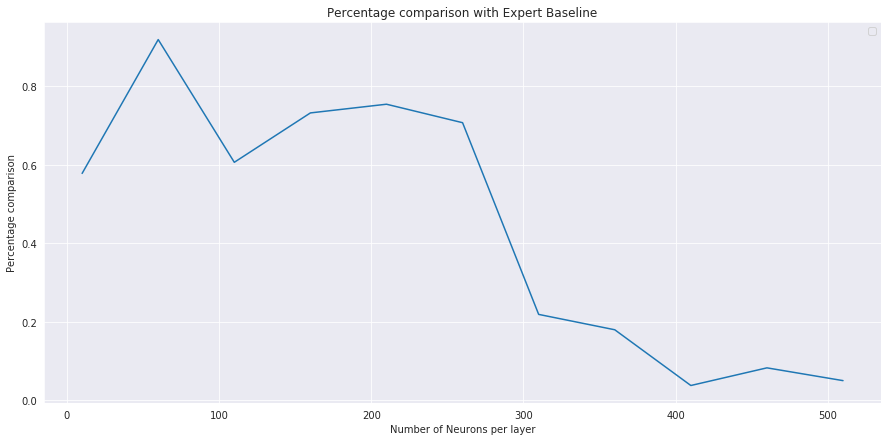

In [180]:
from seaborn.axisgrid import pairplot
# Plotting the %
plt.figure(figsize = (15,7))
plt.plot(neurons,evals/exp)

plt.title('Percentage comparison with Expert Baseline')

plt.xlabel("Number of Neurons per layer")
plt.ylabel("Percentage comparison")

plt.legend()
plt.show()

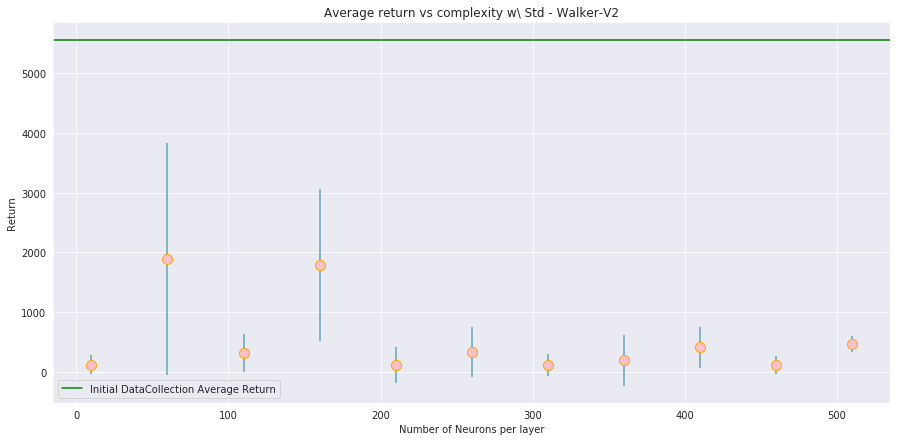

<Figure size 432x288 with 0 Axes>

In [194]:
# Plotting the stds Mean return
plt.figure(figsize = (15,7))
plt.errorbar(neurons,evals,stds,linestyle='None',color='#5fa5b9' , marker = 'o', markersize = 10, markerfacecolor='pink', markeredgecolor="orange",)

plt.axhline(y=exp[0], color='g', linestyle='-', label = "Initial DataCollection Average Return")

plt.title('Average return vs complexity w\ Std - Walker-V2')

plt.xlabel("Number of Neurons per layer")
plt.ylabel("Return")

plt.legend()
plt.show()

plt.savefig("avg")

## Running DAgger (Problem 2)
Modify the settings above:
1. check the `do_dagger` box
2. set `n_iters` to `10`
and then rerun the code.

In [118]:
#@title runtime arguments

class Args:

  def __getitem__(self, key):
    return getattr(self, key)

  def __setitem__(self, key, val):
    setattr(self, key, val)

  #@markdown expert data
  expert_policy_file = 'cs285/policies/experts/Ant.pkl' #@param
  expert_data = 'cs285/expert_data/expert_data_Ant-v2.pkl' #@param
  env_name = 'Ant-v2' #@param ['Ant-v2', 'Humanoid-v2', 'Walker2d-v2', 'HalfCheetah-v2', 'Hopper-v2']
  exp_name = 'test_bc_ant' #@param
  do_dagger = True #@param {type: "boolean"}
  ep_len = 1000 #@param {type: "integer"}
  save_params = False #@param {type: "boolean"}

  num_agent_train_steps_per_iter = 1000 #@param {type: "integer"})
  n_iter = 10 #@param {type: "integer"})

  #@markdown batches & buffers
  batch_size = 1000 #@param {type: "integer"})
  eval_batch_size =  5000#@param {type: "integer"}
  train_batch_size = 100 #@param {type: "integer"}
  max_replay_buffer_size = 1000000 #@param {type: "integer"}

  #@markdown network
  n_layers =  2#@param {type: "integer"}
  size = 64 #@param {type: "integer"}
  learning_rate = 1e-3 #@param {type: "number"}

  #@markdown logging
  video_log_freq = 5 #@param {type: "integer"}
  scalar_log_freq = 1 #@param {type: "integer"}

  #@markdown gpu & run-time settings
  no_gpu = False #@param {type: "boolean"}
  which_gpu = 0 #@param {type: "integer"}
  seed = 1 #@param {type: "integer"}

args = Args()


In [135]:
#@title define `BC_Trainer`
class BC_Trainer(object):

    def __init__(self, params):
        #######################
        ## AGENT PARAMS
        #######################

        agent_params = {
            'n_layers': params['n_layers'],
            'size': params['size'],
            'learning_rate': params['learning_rate'],
            'max_replay_buffer_size': params['max_replay_buffer_size'],
            }

        self.params = params
        self.params['agent_class'] = BCAgent ## TODO: look in here and implement this
        self.params['agent_params'] = agent_params

        ################
        ## RL TRAINER
        ################

        self.rl_trainer = RL_Trainer(self.params) ## TODO: look in here and implement this

        #######################
        ## LOAD EXPERT POLICY
        #######################

        print('Loading expert policy from...', self.params['expert_policy_file'])
        self.loaded_expert_policy = LoadedGaussianPolicy(self.params['expert_policy_file'])
        print('Done restoring expert policy...')

    def run_training_loop(self):

        return self.rl_trainer.run_training_loop(
            n_iter=self.params['n_iter'],
            initial_expertdata=self.params['expert_data'],
            collect_policy=self.rl_trainer.agent.actor,
            eval_policy=self.rl_trainer.agent.actor,
            relabel_with_expert=self.params['do_dagger'],
            expert_policy=self.loaded_expert_policy,
        )


In [136]:
#@title create directory for logging

if args.do_dagger:
    logdir_prefix = 'q2_'  # The autograder uses the prefix `q2_`
    assert args.n_iter>1, ('DAgger needs more than 1 iteration (n_iter>1) of training, to iteratively query the expert and train (after 1st warmstarting from behavior cloning).')
else:
    logdir_prefix = 'q1_'  # The autograder uses the prefix `q1_`
    assert args.n_iter==1, ('Vanilla behavior cloning collects expert data just once (n_iter=1)')

data_path ='/content/cs285_f2021/hw1/data'
if not (os.path.exists(data_path)):
    os.makedirs(data_path)
logdir = logdir_prefix + args.exp_name + '_' + args.env_name + \
         '_' + time.strftime("%d-%m-%Y_%H-%M-%S")
logdir = os.path.join(data_path, logdir)
args['logdir'] = logdir
if not(os.path.exists(logdir)):
    os.makedirs(logdir)

In [139]:
## run training
print(args.logdir)
trainer = BC_Trainer(args)
res = trainer.run_training_loop()



/content/cs285_f2021/hw1/data/q2_test_bc_ant_Ant-v2_26-01-2022_22-11-21
########################
logging outputs to  /content/cs285_f2021/hw1/data/q2_test_bc_ant_Ant-v2_26-01-2022_22-11-21
########################
GPU not detected. Defaulting to CPU.
6
Loading expert policy from... cs285/policies/experts/Walker2d.pkl
obs (1, 17) (1, 17)
Done restoring expert policy...


********** Iteration 0 ************

Training agent using sampled data from replay buffer...

Beginning logging procedure...

Eval_AverageReturn : 322.51788330078125
Eval_StdReturn : 319.0072326660156
Eval_MaxReturn : 1775.6551513671875
Eval_MinReturn : -3.1726467609405518
Eval_AverageEpLen : 161.3030303030303
Train_AverageReturn : 5566.845703125
Train_StdReturn : 9.237548828125
Train_MaxReturn : 5576.08349609375
Train_MinReturn : 5557.6083984375
Train_AverageEpLen : 1000.0
Train_EnvstepsSoFar : 0
TimeSinceStart : 6.251890659332275
Training Loss : 2.6198837757110596
Initial_DataCollection_AverageReturn : 5566.845703125


MoviePy - Building file /tmp/tmpfpaolfh3.gif with imageio.


Eval_AverageReturn : 5365.7275390625
Eval_StdReturn : 98.5020751953125
Eval_MaxReturn : 5445.9951171875
Eval_MinReturn : 5174.66455078125
Eval_AverageEpLen : 1000.0
Train_AverageReturn : 5513.3037109375
Train_StdReturn : 0.0
Train_MaxReturn : 5513.3037109375
Train_MinReturn : 5513.3037109375
Train_AverageEpLen : 1000.0
Train_EnvstepsSoFar : 6527
TimeSinceStart : 51.12149691581726
Training Loss : -4.080346584320068
Initial_DataCollection_AverageReturn : 5566.845703125
Done logging...




********** Iteration 6 ************


Relabelling collected observations with labels from an expert policy...

Training agent using sampled data from replay buffer...

Beginning logging procedure...

Eval_AverageReturn : 5486.728515625
Eval_StdReturn : 16.25647735595703
Eval_MaxReturn : 5511.1630859375
Eval_MinReturn : 5465.38916015625
Eval_AverageEpLen : 1000.0
Train_AverageReturn : 5386.685546875
Train_StdReturn : 0.0
Train_MaxReturn : 5386.685546875
Train_MinReturn : 5386.685546875
Train_AverageEpLen

In [140]:
evals=[]
exp=[]
stds = []
for l in res:
  evals.append(l['Eval_AverageReturn'])
  exp.append(l['Initial_DataCollection_AverageReturn'])
  stds.append(l['Eval_StdReturn'])
evals, exp , stds = np.array(evals), np.array(exp), np.array(stds)

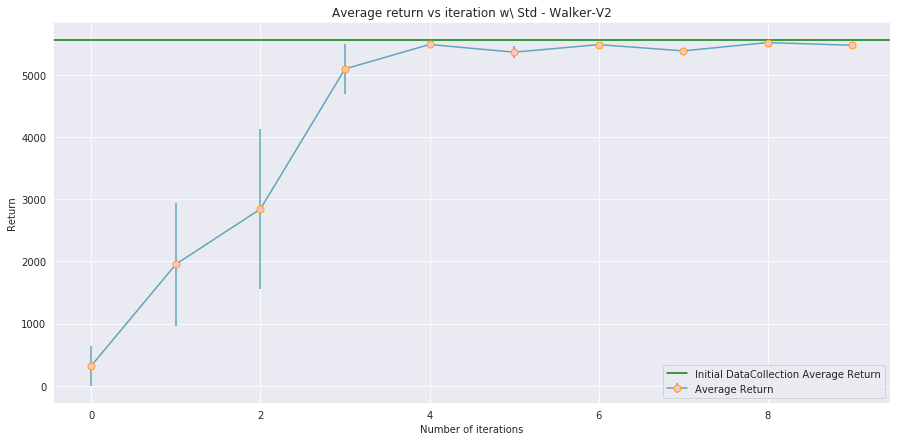

<Figure size 432x288 with 0 Axes>

In [143]:
# Plotting the stds Mean return
plt.figure(figsize = (15,7))
plt.errorbar(range(args.n_iter),evals,stds,linestyle='-',color='#5fa5b9', marker = 'o', markersize = 7, markerfacecolor='pink', markeredgecolor="orange", label = "Average Return")

plt.axhline(y=exp[0], color='g', linestyle='-', label = "Initial DataCollection Average Return")

plt.title('Average return vs iteration w\ Std - Walker-V2')

plt.xlabel("Number of iterations")
plt.ylabel("Return")

plt.legend()
plt.show()

plt.savefig("avg")

In [138]:
args.expert_policy_file = 'cs285/policies/experts/Walker2d.pkl' #@param
args.expert_data = 'cs285/expert_data/expert_data_Walker2d-v2.pkl' #@param
args.env_name = 'Walker2d-v2' #@param ['Ant-v2', 'Humanoid-v2', 'Walker2d-v2', 'HalfCheetah-v2', 'Hopper-v2']
args.exp_name = 'test_bc_walker' #@param
#args_bis.do_dagger = False #@param {type: "boolean"}

In [134]:
if args_bis.do_dagger:
    logdir_prefix = 'q2_'  # The autograder uses the prefix `q2_`
    assert args_bis.n_iter>1, ('DAgger needs more than 1 iteration (n_iter>1) of training, to iteratively query the expert and train (after 1st warmstarting from behavior cloning).')
else:
    logdir_prefix = 'q1_'  # The autograder uses the prefix `q1_`
    assert args_bis.n_iter==1, ('Vanilla behavior cloning collects expert data just once (n_iter=1)')

logdir = logdir_prefix + args_bis.exp_name + '_' + args_bis.env_name + \
         '_' + time.strftime("%d-%m-%Y_%H-%M-%S")
logdir = os.path.join(data_path, logdir)
args_bis['logdir'] = logdir
if not(os.path.exists(logdir)):
    os.makedirs(logdir)